# 1. diffusersの使い方

モデルの宣言

In [1]:
from PIL import Image

In [2]:
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1-base") #モデルの指定
pipe.to("cuda") # GPU使用

/home/student/anaconda3/envs/diffusion_test/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/student/anaconda3/envs/diffusion_test/lib/python3.12/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
text_encoder/pytorch_model.fp16.safetensors not found
Fetching 22 files: 100%|██████████| 22/22 [05:28<00:00, 14.94s/it]


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.10.2",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

画像を生成

  0%|          | 0/50 [00:00<?, ?it/s]/home/student/anaconda3/envs/diffusion_test/lib/python3.12/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
100%|██████████| 50/50 [00:06<00:00,  8.09it/s]


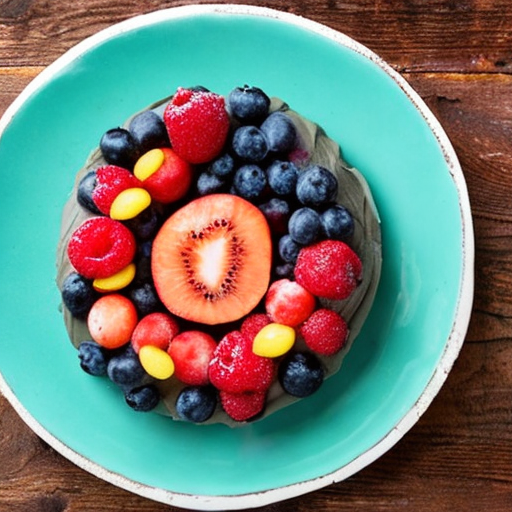

In [3]:
prompt = "cake with fruit"

image = pipe(prompt).images[0]
image

In [4]:
result = pipe(prompt)
print(result)

100%|██████████| 50/50 [00:06<00:00,  8.24it/s]


StableDiffusionPipelineOutput(images=[<PIL.Image.Image image mode=RGB size=512x512 at 0x75CEBD182CC0>], nsfw_content_detected=None)


シード値を固定して画像を生成

100%|██████████| 50/50 [00:06<00:00,  8.23it/s]


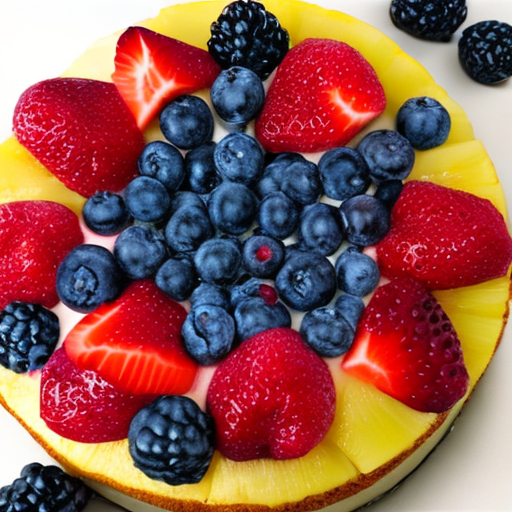

In [5]:
import torch

generator = torch.Generator("cuda").manual_seed(256)
image = pipe(prompt, guidance_scale=7.5, generator=generator).images[0]
image

num_inference_steps

100%|██████████| 5/5 [00:00<00:00,  7.07it/s]


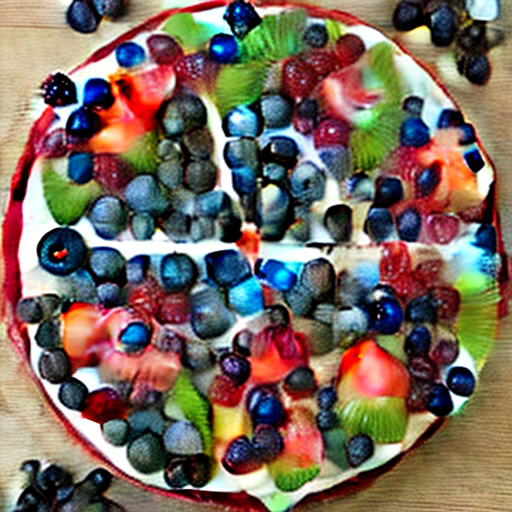

In [6]:
import torch

generator = torch.Generator("cuda").manual_seed(256)
image = pipe(prompt, guidance_scale=7.5, num_inference_steps=5, generator=generator).images[0]
image

100%|██████████| 15/15 [00:01<00:00,  7.90it/s]


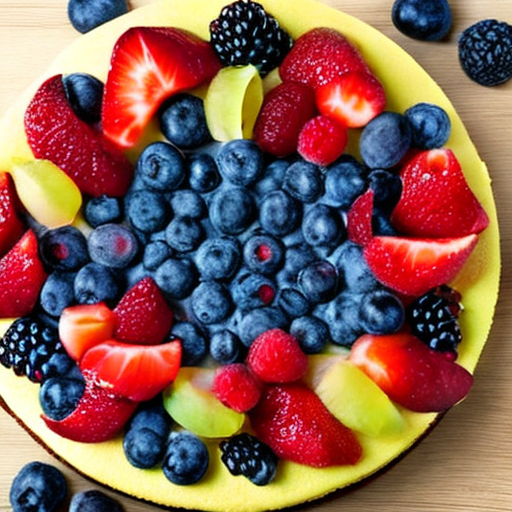

In [7]:
import torch

generator = torch.Generator("cuda").manual_seed(256)
image = pipe(prompt, guidance_scale=7.5, num_inference_steps=15, generator=generator).images[0]
image

100%|██████████| 75/75 [00:09<00:00,  8.26it/s]


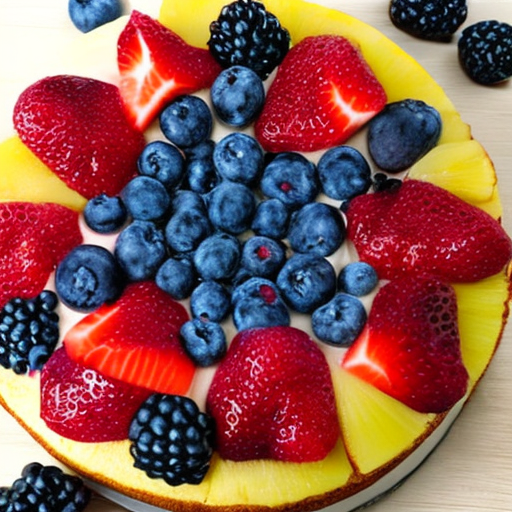

In [8]:
import torch

generator = torch.Generator("cuda").manual_seed(256)
image = pipe(prompt, guidance_scale=7.5, num_inference_steps=75, generator=generator).images[0]
image

In [9]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:16<00:00,  2.96it/s]


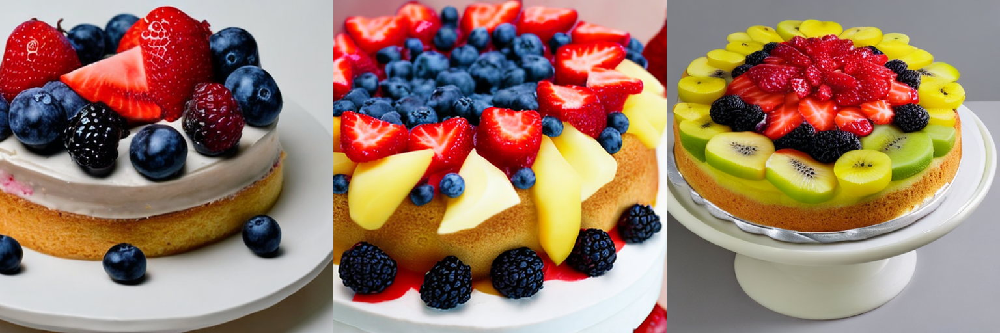

In [13]:
num_images = 3
prompt = ["cake with fruit"] * num_images

images = pipe(prompt).images

grid = image_grid(images, rows=1, cols=3)
grid

100%|██████████| 50/50 [00:10<00:00,  4.69it/s]


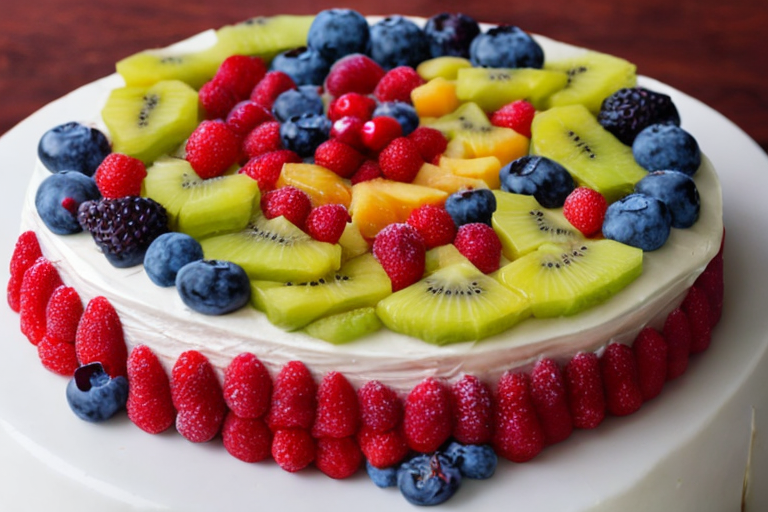

In [12]:
prompt = "cake with fruit"
image = pipe(prompt, height=512, width=768).images[0]
image

# 2. 載ってないけど必要そうな部分

## 2.1. ネガティブプロンプト

100%|██████████| 50/50 [00:06<00:00,  8.16it/s]


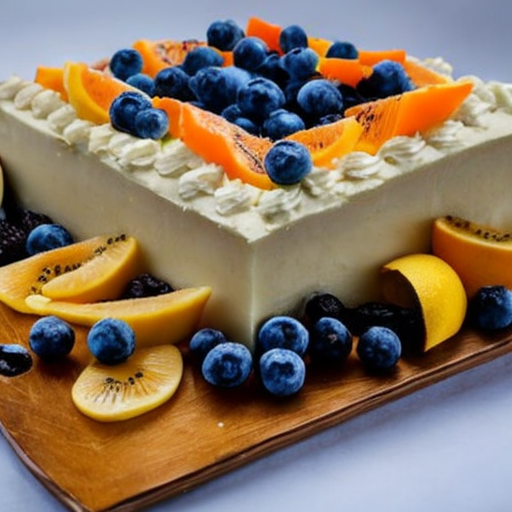

In [14]:
#プロンプト
prompt = "cake with fruit" #フルーツの載ったケーキ
#ネガティブプロンプト
n_prompt = "strawberry" #いちご

image = pipe(prompt,negative_prompt=n_prompt).images[0]
image

## 2.2. 画像を入力とするdiffusion

In [1]:
import torch
from torch import autocast
from diffusers import StableDiffusionImg2ImgPipeline

/home/student/anaconda3/envs/diffusion_test/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [19]:
model_id = "stabilityai/stable-diffusion-2-1-base"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(model_id)
pipe.to("cuda") # GPU使用

/home/student/anaconda3/envs/diffusion_test/lib/python3.12/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
text_encoder/pytorch_model.fp16.safetensors not found
Fetching 22 files: 100%|██████████| 22/22 [00:00<00:00, 51665.56it/s]


StableDiffusionImg2ImgPipeline {
  "_class_name": "StableDiffusionImg2ImgPipeline",
  "_diffusers_version": "0.10.2",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

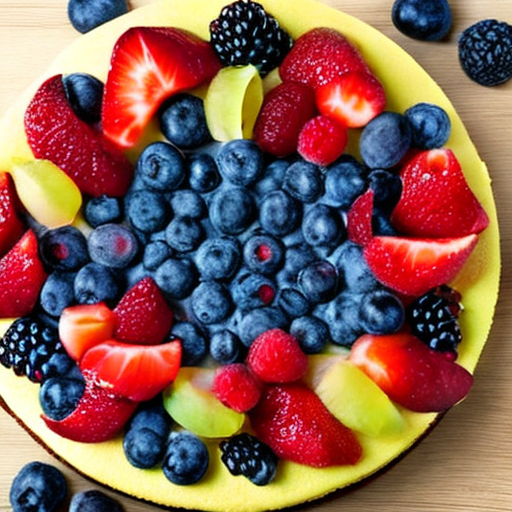

In [5]:
from PIL import Image
init_img = Image.open("image/cake.png")
init_img

100%|██████████| 37/37 [00:02<00:00, 13.48it/s]


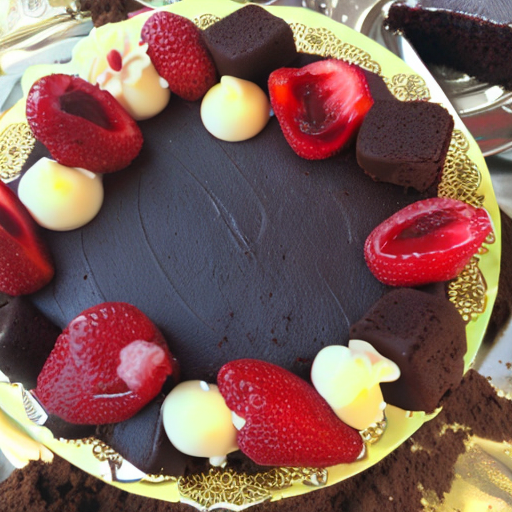

In [6]:
prompt = "chocolate cake"

# パイプラインの実行
generator = torch.Generator("cuda").manual_seed(512)
with torch.autocast("cuda"):
    image = pipe(prompt, image=init_img, guidance_scale=7.5, strength=0.75, generator=generator).images[0]  

image

100%|██████████| 37/37 [00:02<00:00, 13.60it/s]


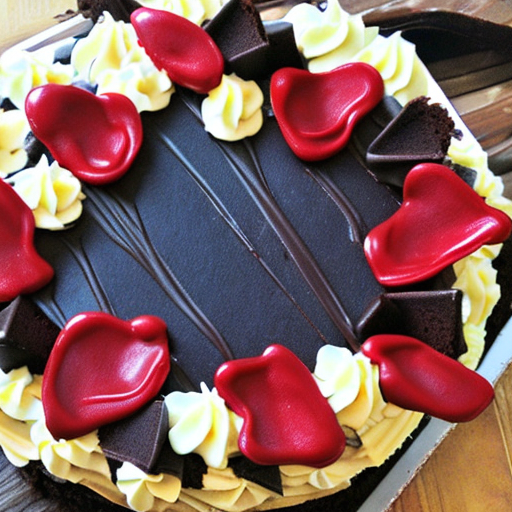

In [23]:
prompt = "chocolate cake"
n_prompt = "fruits"

# パイプラインの実行
generator = torch.Generator("cuda").manual_seed(512)
with torch.autocast("cuda"):
    image = pipe(prompt, negative_prompt=n_prompt,image=init_img, guidance_scale=7.5, strength=0.75, generator=generator).images[0]  

image

# 3. 独自の推論パイプライン

In [25]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

# 1. Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

/home/student/anaconda3/envs/diffusion_test/lib/python3.12/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.


In [26]:
from diffusers import LMSDiscreteScheduler

scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

In [27]:
torch_device = "cuda"
vae.to(torch_device)
text_encoder.to(torch_device)
unet.to(torch_device) 

UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (attn1): CrossAttention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
                (to_k): Linear(in_features=320, out_features=320, bias=False)
                (to_v): Linear(in_features=320, out_features=320, bias=False)
                (to_out): ModuleList(
          

In [28]:
prompt = ["a photograph of an astronaut riding a horse"]

height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion

num_inference_steps = 100           # Number of denoising steps

guidance_scale = 7.5                # Scale for classifier-free guidance

generator = torch.manual_seed(0)    # Seed generator to create the inital latent noise

batch_size = len(prompt)

In [29]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

In [30]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]  

In [31]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

In [32]:
latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
)
latents = latents.to(torch_device)

In [33]:
scheduler.set_timesteps(num_inference_steps)

In [34]:
latents = latents * scheduler.init_noise_sigma

In [35]:
from tqdm.auto import tqdm

scheduler.set_timesteps(num_inference_steps)

for t in tqdm(scheduler.timesteps):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)

    latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample

100%|██████████| 100/100 [00:13<00:00,  7.64it/s]


In [36]:
# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents
with torch.no_grad():
    image = vae.decode(latents).sample

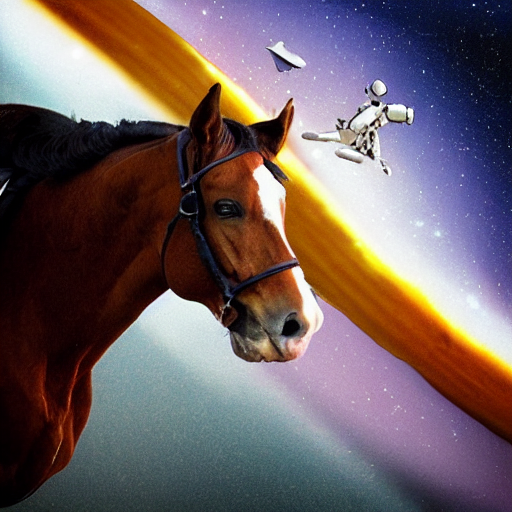

In [37]:
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]
pil_images[0]